# Исследование рынка заведений общественного питания в Москве

Клиенты хотят открыть заведение общественного питания. Необходимо подготовить исследование рынка заведений общественного питания города Москвы, найти интересные особенности и информативно и лаконично презентовать результаты клиентам.

### Описание данных
*Файл **moscow_places.csv**.*
- **name** — название заведения
- **address** — адрес заведения
- **category** — категория заведения, например «кафе», «пиццерия» или «кофейня»
- **hours** — информация о днях и часах работы
- **lat** — широта географической точки, в которой находится заведение
- **lng** — долгота географической точки, в которой находится заведение
- **rating** — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0)
- **price** — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее
- **avg_bill** — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
 - «Средний счёт: 1000–1500 ₽».
 - «Цена чашки капучино: 130–220 ₽».
 - «Цена бокала пива: 400–600 ₽» и так далее.
- **middle_avg_bill** — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
 - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
 - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
 - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- **middle_coffee_cup** — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
 - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
 - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
 - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- **chain** — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
 - 0 — заведение не является сетевым.
 - 1 — заведение является сетевым.
- **district** — административный район, в котором находится заведение, например Центральный административный округ
- **seats** — количество посадочных мест

## Вывод:
По итогам исследования можно дать следующие рекомендации по открытию кофейни в Москве:
- `По расположению` рассмотреть варианты:
 - **Центральный округ**
   - больше всего заведений этого типа
   - центр города (активное население, высокая проходимость)
   - высокая медианная цена чашки кофе
 - **Западный, Юго-Западный округа**
   - высокая медианная цена чашки кофе
   - меньшее количество кофеен - меньше конкуренция
   - возможно, более низкая цена аренды помещения по сравнению с центром города
- `По времени работы` рассмотреть вариант **круглосуточной** кофейни, так как в Москве их всего 59 (около 4%) и большинство находится в центре
- `По стоимости чашки кофе` стоит ориентироваться на сумму **150-250 Р**

## Обзор данных

In [1]:
!pip install folium 

In [2]:
# импортируем библиотеки
import datetime as dt
import folium
import json
import math as mth
import numpy as np
import pandas as pd
import plotly.express as px
import seaborn as sns
import warnings

from datetime import timedelta
from folium import Choropleth, Map, Marker
from folium.plugins import MarkerCluster
from matplotlib import pyplot as plt
from plotly import graph_objects as go
from scipy import stats as st

sns.set()
warnings.filterwarnings('ignore')

In [3]:
# снимаем ограничение на количество столбцов
pd.set_option('display.max_columns', None)

pd.set_option('display.max_rows', None)

# снимаем ограничение на ширину столбцов
pd.set_option('display.max_colwidth', None)

# ограничиваем количество знаков после запятой
pd.options.display.float_format = '{:,.2f}'.format

In [4]:
# читаем файл csv
try:
    df = pd.read_csv('moscow_places.csv')
except:
    df = pd.read_csv('/datasets/moscow_places.csv')
display(df.head())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,"1,550.00",NaN,0,4.00
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,"1,000.00",NaN,0,45.00
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00


In [5]:
# изучаем информацию о данных
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


##### Вывод:
Всего представлена информация о **8406** заведениях.\
Есть пропуски в столбцах **hours**, **price**, **avg_bill**, **middle_avg_bill**, **middle_coffee_cup**, **seats**.\
Столбцы **name**, **category**, **address**, **district**, **hours**, **price**, **avg_bill** имеют тип `object`.\
Столбцы **lat**, **lng**, **rating**, **middle_avg_bill**, **middle_coffee_cup**, **seats** имеют тип `float64`.\
Столбец **chain** имеет тип `int64`.\
В ходе предобработки данных необходимо:
- привести значения столбца **name** к нижнему регистру и удалить лишние символы
- проверить наличие дубликатов
- оценить возможность обработки пропусков
- создать столбец **street** с названиями улиц из столбца с адресом
- создать столбец **is_24/7** с обозначением, что заведение работает ежедневно и круглосуточно: `True` - да, `False` - нет.

## Предобработка данных

In [6]:
# приводим значения в столбце name к нижнему регистру, удаляем лишние символы
symbols = ['"', ',', '«', '»', '(', ')', '!', '№']

for s in symbols:
    df['name'] = df['name'].str.replace(s, ' ', regex=False)
df['name'] = df['name'].str.lower().str.strip()

display(df['name'].value_counts().head(15))

кафе                                   189
шоколадница                            120
домино'с пицца                          77
додо пицца                              74
one price coffee                        72
яндекс лавка                            69
cofix                                   65
prime                                   50
хинкальная                              44
шаурма                                  43
кофепорт                                42
кулинарная лавка братьев караваевых     39
теремок                                 38
чайхана                                 37
ресторан                                34
Name: name, dtype: int64

In [7]:
# проверяем разные варианты написания популярных заведений и приводим к одному
df['name'] = df['name'].str.replace('\\bторты от сети кофеен шоколадница\\b', 'шоколадница')
df['name'] = df['name'].str.replace("\\bдомино'с пицца\\b", 'доминос пицца')
df['name'] = df['name'].str.replace("\\bдомино'с\\b", 'доминос пицца')
df['name'] = df['name'].str.replace('\\bяндекс лавка\\b', 'яндекс еда')
df['name'] = df['name'].str.replace('\\bяндекс.лавка\\b', 'яндекс еда')

#df[df['name'].str.contains('яндекс')]['name'].unique()

In [8]:
# ищем явные дубликаты
print('Количество дубликатов:', df.duplicated().sum())
# проверям дубликаты по имени и адресу заведения
print('Количество дубликатов:', df.duplicated(subset=['name', 'address']).sum())
df = df.drop_duplicates(subset=['name', 'address'], keep='last')
print('Количество дубликатов после обработки:', df.duplicated(subset=['name', 'address']).sum())

Количество дубликатов: 0
Количество дубликатов: 4
Количество дубликатов после обработки: 0


Что касается пропусков: в тех столбцах, где они обнаружены, заполнение средним или медианным значением может сильно исказить результаты исследования. Оставляем их.

In [9]:
# создаём столбец street с названиями улиц из столбца с адресом
# преобразовываем строку в список, выбираем элемент с улицей
df['street'] = df['address'].str.split(',', expand=True)[1].str.strip()
# проверяем результат
df[['address', 'street']].sample(5)

,address,street
8263,"Москва, улица Юных Ленинцев, 115",улица Юных Ленинцев
3554,"Москва, Большая Садовая улица, 5, корп. 1",Большая Садовая улица
8076,"Москва, Южнопортовая улица, 7, стр. 1",Южнопортовая улица
6878,"Москва, улица Академика Пилюгина, 12А",улица Академика Пилюгина
7327,"Москва, район Капотня, 5-й квартал, 24",район Капотня


In [10]:
# создаём столбец is_24/7 с названиями улиц из столбца с временем работы
df['is_24/7'] = df['hours'] == 'ежедневно, круглосуточно'
# проверяем результат
df[['hours', 'is_24/7']].sample(5)

,hours,is_24/7
1982,"ежедневно, 08:00–21:00",False
2858,"ежедневно, 08:00–22:00",False
8135,"ежедневно, 09:00–21:00",False
4472,"пн-пт 11:00–23:00; сб,вс 11:00–00:00",False
2727,"ежедневно, 11:00–00:00",False


## Анализ данных

#### Анализ категорий заведений

In [11]:
# группируем таблицу по категориям
categories = (df
              .groupby('category')
              .agg({'name':'count'})
              .sort_values(by='name', ascending=False)
              .reset_index())
categories.columns = ['category', 'name_count']

# добавляем столбец с долей от общего числа
categories['share, %'] = categories['name_count'] / df['name'].count() * 100
display(categories)

# строим график
fig = px.bar(
    categories, 
    x='category', 
    y='name_count',
    title='Количество заведений по категориям',
    labels={'category':'', 'name_count':'количество'},
    width=950,
    height=600)
fig.show()

,category,name_count,"share, %"
0,кафе,2377,28.29
1,ресторан,2041,24.29
2,кофейня,1413,16.82
3,"бар,паб",765,9.10
4,пиццерия,633,7.53
5,быстрое питание,603,7.18
6,столовая,315,3.75
7,булочная,255,3.03


Три самых `многочисленных` типа заведений - это **кафе**, **ресторан** и **кофейня**. В совокупности, на них приходится почти **70%** всех заведений общественного питания.

#### Анализ количества посадочных мест в заведениях по категориям

In [12]:
# группируем таблицу по посадочным местам 
seats = (df
         .groupby('category')
         .agg({'seats':['median', 'mean', 'count']})
         .reset_index())

seats.columns = ['category', 'seats_median', 'seats_mean', 'seats_count']
seats = (seats
         .sort_values(by='seats_median', ascending=False))
display(seats)

# строим график
fig = px.bar(
    seats, 
    x='category', 
    y='seats_median',
    title='Количество посадочных мест в заведениях по категориям',
    labels={'category':'', 'seats_median':'медианное количество мест'},
    width=950,
    height=600)
fig.show()

,category,seats_median,seats_mean,seats_count
6,ресторан,86.00,121.87,1268
0,"бар,паб",82.50,124.53,468
4,кофейня,80.00,111.20,751
7,столовая,75.50,99.75,164
2,быстрое питание,65.00,98.89,349
3,кафе,60.00,97.51,1218
5,пиццерия,55.00,94.50,427
1,булочная,50.00,88.12,147


В столбце с `количеством посадочных мест` очень `много пропущенных значений`, поэтому за показатель возьмём `медианные значения`. По этому показателю `лидерами` по количеству посадочных мест являются **рестораны**, **бары, пабы**, **кофейни** и **столовые**. Однако даже между **рестораном** и **булочной** - которая находится на последнем месте по количеству мест, нет даже двукратного различия. Если брать в расчёт `средние` показатели, то эта разница сокращается примерно до **25%**.

#### Соотношение сетевых и несетевых заведений

In [13]:
# строим круговую диаграмму
fig = go.Figure(
    go.Pie(
        values = df['chain'].value_counts(),
        labels=['Несетевые', 'Сетевые'],
        title='Cоотношение сетевых и несетевых заведений',
        hoverinfo='value',
        textinfo='label+percent',
        textfont_size=20,
        marker=dict(
            line=dict(color='#000000', width=1)),
        pull=[0.01, 0.01]))
fig.show()

Видим, что `несетевых` заведений `больше` примерно на **20%** или в **1,5** раза. 

#### Категории сетевых заведений

In [14]:
# группируем таблицу по категориям и сетевым заведениям 
chains = (df
          .replace({'chain': {0: 'non_chain', 1: 'chain'}})
          .pivot_table(
              columns='chain',
              index='category',
              values='name',
              aggfunc='count'))

chains['chain_share'] = chains['chain'] / (chains['chain'] + chains['non_chain']) * 100
chains = (chains
          .sort_values(by='chain_share', ascending=False)
          .reset_index())
display(chains)

# строим график
fig = px.bar(
    chains, 
    x='category', 
    y=['chain', 'non_chain'],
    color='chain_share',
    title='Соотношение сетевых и несетевых заведений по категориям',
    labels={'category':'', 'chain_share':'% сетевых'},
    width=950,
    height=600)
fig.layout.update(yaxis_title='количество заведений',
                  xaxis={'categoryorder': 'total descending'})
fig.show()

chain,category,chain,non_chain,chain_share
0,булочная,156,99,61.18
1,пиццерия,330,303,52.13
2,кофейня,720,693,50.96
3,быстрое питание,232,371,38.47
4,ресторан,730,1311,35.77
5,кафе,779,1598,32.77
6,столовая,88,227,27.94
7,"бар,паб",169,596,22.09


На графике видим, что в `категориях` **пиццерия**, **кофейня** и **булочная** заведений `сетевого` типа **больше 50%**, **булочных** вообще **больше 60%**. В остальных `категориях преобладают` заведения `несетевого` типа. `Меньше всего сетевых заведений` среди **баров, пабов** - всего **22%**.

#### Топ-15 сетей в Москве

In [15]:
# группируем таблицу по названиям, категориям и сетевым заведениям 
top_15_chains = (df
                 .groupby('name')
                 .agg({'chain':'sum', 'category':'first'})
                 .rename(columns={'chain':'total'})
                 .sort_values(by='total', ascending=False)
                 .reset_index()
                 .head(15))
display(top_15_chains)

# строим график
fig = px.bar(
    top_15_chains, 
    x='total', 
    y='name',
    orientation='h',
    text='total',
    title='Топ-15 сетевых заведений в Москве',
    labels={'total':'количество', 'name':''},
    width=950,
    height=600)
fig.layout.update(showlegend=False,
                  yaxis={'categoryorder': 'total ascending'})
fig.show()

# считаем категории сетей из топ-15
display(top_15_chains['category'].value_counts())

,name,total,category
0,шоколадница,120,кофейня
1,доминос пицца,76,пиццерия
2,додо пицца,74,пиццерия
3,яндекс еда,72,ресторан
4,one price coffee,71,кофейня
5,cofix,65,кофейня
6,prime,50,ресторан
7,хинкальная,44,быстрое питание
8,кофепорт,42,кофейня
9,кулинарная лавка братьев караваевых,39,кафе


кофейня            5
ресторан           3
кафе               3
пиццерия           2
булочная           1
быстрое питание    1
Name: category, dtype: int64

Многие `сети` из данного топа `известны` и за пределами Москвы, поэтому `объединяющим фактором` я бы отметил `размер сети` и `географический размах` их представленности в стране.\
Самыми `популярными` заведениями являются **кофейни**. Это можно объяснить большим количеством офисных сотрудников в мегаполисе, использующих кофейни для перекуса, а также большим количеством активных людей, уважающих качественно приготовленный кофе.\
**11** сетей из **топ-15** попадают в `самые распространённые категории заведений` в Москве: **кафе**, **ресторан** и **кофейня**.\
**8** сетей из **топ-15** попадают в `самые распространённые категории сетевых заведений`: **пиццерия**, **кофейня** и **булочная**.

#### Распределение заведений по районам Москвы

In [16]:
# смотрим какие районы Москвы есть в данных
df['district'].value_counts()

Центральный административный округ         2242
Северный административный округ             898
Южный административный округ                892
Северо-Восточный административный округ     890
Западный административный округ             850
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: district, dtype: int64

В **Центральном округе** заведений `значительно больше`, что не удивительно, ведь центр города всегда является наибольшей `точкой притяжения` и `активности` населения.

In [17]:
# создаём сводную таблицу с количеством заведений каждой категории по районам
districts = (df
             .pivot_table(
                 index=['district', 'category'],
                 values='name',
                 aggfunc='count')
             .rename(columns={'name':'count'})
             .sort_values(by='count', ascending=False)
             .reset_index())
districts.head()

,district,category,count
0,Центральный административный округ,ресторан,670
1,Центральный административный округ,кафе,464
2,Центральный административный округ,кофейня,428
3,Центральный административный округ,"бар,паб",364
4,Юго-Восточный административный округ,кафе,282


In [18]:
# строим график
fig = px.bar(
    districts, 
    x='district', 
    y='count',
    color='category',
    title='Количество заведений разных категорий по районам Москвы',
    labels={'category':'', 'count':'количество заведений', 'district':''},
    width=950,
    height=1000)
fig.show()

На этом графике также видно, что `самые частые` заведения, вне зависимости от района, это **кафе**, **рестораны** и **кофейни**.\
**Центральный округ** выделяется гораздо `большим количеством` **баров, пабов** - сопостовимым в этом районе по количеству с тремя самыми популярными категориями.

#### Средние рейтинги по категориям заведений

,category,rating_mean,rating_median
0,"бар,паб",4.39,4.40
1,пиццерия,4.30,4.30
2,ресторан,4.29,4.30
3,кофейня,4.28,4.30
4,булочная,4.27,4.30
5,столовая,4.21,4.30
6,кафе,4.12,4.20
7,быстрое питание,4.05,4.20


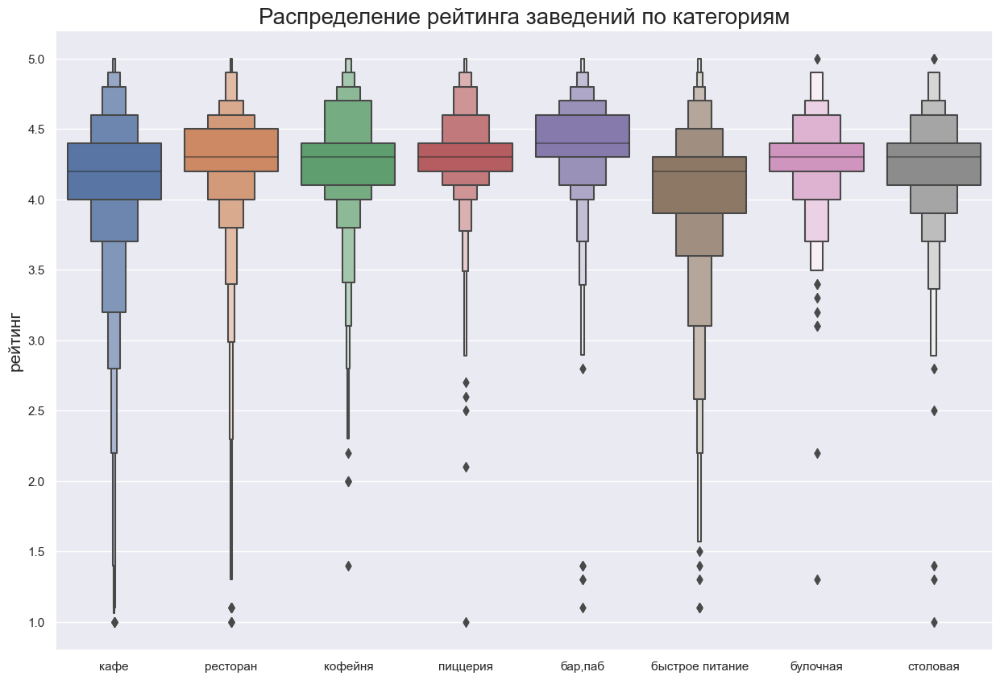

In [19]:
# группируем таблицу по категориям, находим средний и медианный рейтинг
ratings = (df
           .groupby('category')
           .agg({'rating':['mean', 'median']})
           .sort_values(by=('rating', 'mean'), ascending=False)
           .reset_index())
ratings.columns = ['category', 'rating_mean', 'rating_median']
display(ratings)

# строим график
plt.figure(figsize=(15,10))

sns.boxenplot(
    data=df,
    x='category',
    y='rating')
plt.title('Распределение рейтинга заведений по категориям', fontsize=20)
plt.xlabel('', fontsize=15)
plt.ylabel('рейтинг', fontsize=15)
plt.show()

`Средние рейтинги` почти во всех категориях очень `близки` к `медианным` значениям. И, по большому счёту, не очень различаются в разных категориях. Однако, в **столовых**, **кафе** и **быстром питании** рейтинги `немного ниже`, возможно это связано с более `простым` и `дешёвым уровнем обслуживания` в этих заведениях и `меньшими требованиями к навыкам персонала`.\
`Рейтинги` **баров, пабов** отличаются в `лучшую сторону`, возможно из-за наличия каких-то `развлекательных программ` и наличия или большего выбора `алкоголя в меню`.

#### Картограмма средних рейтингов районов Москвы

In [20]:
# группируем таблицу по средним рейтингам для районов
ratings_district = (df
                    .groupby('district')
                    .agg({'rating':'mean'})
                    .rename(columns={'rating':'mean_rating'})
                    .sort_values(by='mean_rating', ascending=False)
                    .reset_index())
display(ratings_district)

,district,mean_rating
0,Центральный административный округ,4.38
1,Северный административный округ,4.24
2,Северо-Западный административный округ,4.21
3,Южный административный округ,4.18
4,Западный административный округ,4.18
5,Восточный административный округ,4.17
6,Юго-Западный административный округ,4.17
7,Северо-Восточный административный округ,4.15
8,Юго-Восточный административный округ,4.10


In [21]:
# загружаем файл с границами районов Москвы
district_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
    
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng])

# строим хороплет
Choropleth(
    geo_data=district_geo,
    data=ratings_district,
    columns=['district', 'mean_rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.7,
    legend_name='Средний рейтинг заведений по районам').add_to(m)

m

На карте видим, что `средний рейтинг` в **Центральном**, **Северном** и **Северо-западном** округах `немного выше`, чем в остальных.

#### Отображение заведений с помощью кластеров

In [22]:
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)
# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)
m

#### Топ-15 улиц по количеству заведений

In [23]:
# группируем таблицу по улицам и количеству заведений на них по категориям
# таблица с количеством заведений по улицам
top_streets = (df
               .groupby('street')
               .agg({'name':'count'})
               .rename(columns={'name':'total'})
               .sort_values(by='total', ascending=False)
               .reset_index())
# таблица топ-15 улиц по количеству заведений
top_15_streets = top_streets.head(15)
display(top_15_streets)

# таблица с количеством заведений по категориям из топ-15 улиц
top_15_streets_category = (df
                           .query('street in @top_15_streets.street')
                           .pivot_table(
                               index=['street', 'category'],
                               values='name',
                               aggfunc='count')
                           .rename(columns={'name':'total'})
                           .sort_values(by='street')
                           .reset_index())

# строим график
fig = px.bar(
    top_15_streets_category,
    orientation='h',
    x='total', 
    y='street',
    color='category',
    title='Количество заведений разных категорий по улицам Москвы',
    labels={'category':'', 'total':'Количество заведений', 'street':''},
    width=1000,
    height=1000)
fig.layout.update(yaxis={'categoryorder': 'total ascending'})
fig.show()

,street,total
0,проспект Мира,183
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


`Самая насыщенная заедениями` улица - это **проспект Мира**, с серьёзным отставанием идут **Профсоюзная улица**, **проспект Вернадского** и **Ленинский проспект**.

#### Улицы с одним объектом общепита

In [24]:
# группируем таблицу по улицам и количеству заведений на них
one_on_street = (df
                 .groupby('street')
                 .agg({'name':'count'})
                 .query('name == 1')
                 .rename(columns={'name':'total'})
                 .reset_index())

# считаем количество заведений по категориям
ones_categories = (df
                   .query('street in @one_on_street.street')
                   .groupby('category')
                   .agg({'name':'count'})
                   .rename(columns={'name':'total'})
                   .sort_values(by='total', ascending=False))
display(ones_categories)

,total
category,
кафе,160
ресторан,93
кофейня,84
"бар,паб",39
столовая,36
быстрое питание,23
пиццерия,15
булочная,8


In [25]:
# размещаем заведения на карте
# создаём карту Москвы
m2 = Map(location=[moscow_lat, moscow_lng])

# создаём пустой кластер, добавляем его на карту
marker_cluster2 = MarkerCluster().add_to(m2)
# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster2)

# применяем функцию create_clusters() к каждой строке датафрейма
df.query('street in @one_on_street.street').apply(create_clusters, axis=1)
m2

Исходя из полученных данных, можно сделать вывод о том, что `единственные на улице` заведения общепита есть **всех категорий** и **во всех районах**. Возможно это происходит из-за того, что `сами улицы являются небольшими`.

#### Медианное значение среднего чека по районам Москвы

In [26]:
# группируем таблицу по районам и среднему чеку
median_bill = (df
               .groupby('district')
               .agg({'middle_avg_bill':'median'})
               .sort_values(by=('middle_avg_bill'), ascending=False)
               .reset_index())
median_bill.columns = ['district', 'median_bill']
median_bill

,district,median_bill
0,Западный административный округ,"1,000.00"
1,Центральный административный округ,"1,000.00"
2,Северо-Западный административный округ,700.00
3,Северный административный округ,650.00
4,Юго-Западный административный округ,600.00
5,Восточный административный округ,575.00
6,Северо-Восточный административный округ,500.00
7,Южный административный округ,500.00
8,Юго-Восточный административный округ,450.00


In [27]:
# создаём карту Москвы
m3 = Map(location=[moscow_lat, moscow_lng])

# строим хороплет
Choropleth(
    geo_data=district_geo,
    data=median_bill,
    columns=['district', 'median_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.7,
    legend_name='Медианное значение среднего чека по районам').add_to(m3)

m3

В **Центральном** и **Западном** округе `медианное значение среднего чека` самое `высокое` - **1000 Р**. `Самые низкие` показатели в **Южном**, **Юго-Восточном** и **Северо-Восточном** округах - порядка **500 Р**.\
За исключением **Западного** округа, при `удалении от центра` города, `медианное значение` среднего чека `снижается`.

#### Исследование заведений с низким рейгингом

In [28]:
# делаем срез по уровню рейтинга
low_rating = (df
              .query('rating <= 3')
              .groupby('district')
              .agg({'name':'count', 'chain':'sum'})
              .rename(columns={'name':'total'})
              .sort_values(by='total', ascending=False)
              .reset_index())
low_rating['chain_share'] = low_rating['chain'] / low_rating['total'] * 100
print(low_rating['chain_share'].mean())
low_rating

30.66032083575943


,district,total,chain,chain_share
0,Юго-Восточный административный округ,50,17,34.00
1,Северо-Восточный административный округ,38,10,26.32
2,Западный административный округ,35,13,37.14
3,Восточный административный округ,30,11,36.67
4,Юго-Западный административный округ,25,9,36.00
5,Северный административный округ,19,7,36.84
6,Южный административный округ,18,4,22.22
7,Северо-Западный административный округ,11,2,18.18
8,Центральный административный округ,7,2,28.57


In [29]:
# создаём сводную таблицу с количеством заведений каждой категории по районам
low_rating_districts = (df
                        .query('rating <= 3')
                        .pivot_table(
                            index=['district', 'category'],
                            values='name',
                            aggfunc='count')
                        .rename(columns={'name':'count'})
                        .sort_values(by='count', ascending=False)
                        .reset_index())
low_rating_districts.head()

,district,category,count
0,Юго-Восточный административный округ,кафе,21
1,Северо-Восточный административный округ,кафе,18
2,Юго-Западный административный округ,кафе,17
3,Западный административный округ,кафе,17
4,Восточный административный округ,кафе,16


In [30]:
# строим график
fig = px.bar(
    low_rating_districts, 
    x='district', 
    y='count',
    color='category',
    title='Количество заведений разных категорий с низким рейтингом по районам Москвы',
    labels={'category':'', 'count':'Количество заведений', 'district':''},
    width=950,
    height=1000)
fig.show()

In [31]:
# размещаем заведения на карте

# создаём пустой кластер, добавляем его на карту
marker_cluster3 = MarkerCluster().add_to(m3)
# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster3)

# применяем функцию create_clusters() к каждой строке датафрейма
df.query('rating <= 3').apply(create_clusters, axis=1)
m3

Судя по графикам можно сделать следующие выводы: `заведения с низким рейтингом есть во всех районах` Москвы, однако, `больше всего` таких заведений `в районах с низким средним чеком и удалённых от центра`. Возможно меньшая прибыль этих заведений из-за низкого среднего чека не позволяет предоставлять достаточный уровень сервиса, чтобы получать высокие оценки от клиентов.\
Среди заведений с низким рейтингом примерно `треть - сетевые заведения`. Это достаточно высокий показатель. Возможно проблема в заведениях открытых по франшизе и имеющих более скромный бюджет, чтобы поддерживать стандарты сети на привычном для клиентов уровне, отсюда и низкие оценки.\
Во всех районах среди заведений `с низким рейтингом` лидируют **кафе**, на втором и третьем местах - **рестораны** и **быстрое питание**.

##### Вывод:
По `количеству заведений` лидируют **кафе** (`28%` от всех заведений), **рестораны** (`24%`) и **кофейни** (`17%`). Остальные категории гораздо малочисленнее.\
По `количеству посадочных мест` медианное значение заведений - лидеров - **75-86 мест**.\
**62%** заведений `не относятся к сетевым`. А `сетевыми` чаще всего `бывают` **пиццерии**, **кофейни** и **булочные**.\
В **Центральном округе** заведений в **2-5 раз** `больше`, чем в других округах. Также в **Центральном округе** `больше всего` **баров, пабов**.\
`Средние рейтинги` **столовых**, **кафе** и **быстрого питания** `немного ниже`, рейтинги **баров, пабов** наоборот `отличаются в лучшую сторону`.\
`Средний рейтинг` в **Центральном**, **Северном** и **Северо-западном** округах `немного выше`, чем в остальных.\
`Самая насыщенная заведениями улица` - это **проспект Мира**, с серьёзным отставанием идут **Профсоюзная улица**, **проспект Вернадского** и **Ленинский проспект**.\
В **Центральном** и **Западном** округе `медианное значение среднего чека` самое высокое - **1000 Р**. Самые низкие показатели в **Южном**, **Юго-Восточном** и **Северо-Восточном** округах - порядка **500 Р**. За исключением **Западного округа**, `при удалении от центра города, медианное значение среднего чека снижается`.\
`Заведения с низким рейтингом` есть `во всех районах` Москвы, однако, `больше всего` таких заведений `в районах с низким средним чеком и удалённых от центра`.\
Среди заведений с низким рейтингом примерно `треть` - `сетевые заведения`. Во всех районах `среди заведений с низким рейтингом лидируют` **кафе**, на втором и третьем местах - **рестораны** и **быстрое питание**.

## Исследование: открытие кофейни

In [32]:
# делаем срез по категории кофейня
coffee_house = (df
                .query('category == "кофейня"')
                .reset_index())

coffee_house_district = (coffee_house
                         .groupby('district')
                         .agg({'name':'count'})
                         .rename(columns={'name':'total'})
                         .sort_values(by='total', ascending=False)
                         .reset_index())
print('Всего кофеен:', coffee_house_district['total'].sum())
display(coffee_house_district)

# строим круговую диаграмму
fig = go.Figure(
    go.Pie(
        values = coffee_house_district['total'],
        labels=coffee_house_district['district'],
        title='Количество кофеен по районам',
        hoverinfo='label+value',
        textinfo='percent',
        textfont_size=15,
        marker=dict(
            line=dict(color='#000000', width=0.5)),
        pull=[0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01,]))
fig.update_layout(margin=dict(t=0, b=0, l=0, r=0))
fig.show()

Всего кофеен: 1413


,district,total
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


В датасете всего **1413** кофеен. Они `есть во всех районах`, однако в **Центральном** округе их `намного больше`. Следующие по количеству идут **Северный**, **Северо-Восточный** и **Западный** округа.

In [33]:
# считаем количество и смотрим расположение круглосуточных кофеен
coffee_house_24 = coffee_house[coffee_house['is_24/7'] == True]
print('Всего кофеен 24/7:', len(coffee_house_24))

display(coffee_house_24
        .groupby('district')
        .agg({'name':'count'})
        .rename(columns={'name':'total'})
        .sort_values(by='total', ascending=False)
        .reset_index())

# создаём карту Москвы
m4 = Map(location=[moscow_lat, moscow_lng])

# создаём пустой кластер, добавляем его на карту
marker_cluster4 = MarkerCluster().add_to(m4)
# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster4)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_house_24.apply(create_clusters, axis=1)
m4

Всего кофеен 24/7: 59


,district,total
0,Центральный административный округ,26
1,Западный административный округ,9
2,Юго-Западный административный округ,7
3,Восточный административный округ,5
4,Северный административный округ,5
5,Северо-Восточный административный округ,3
6,Северо-Западный административный округ,2
7,Юго-Восточный административный округ,1
8,Южный административный округ,1


Среди всех кофеен, есть `заведения, работающие` **круглосуточно**. Их не очень много - всего **59**, и `большая их часть сконцентрирована ближе к центру города`.

In [34]:
# исследуем рейтинги кофеен по районам
# группируем таблицу по районам и рейтингам
coffee_house_rating = (coffee_house
                       .groupby('district')
                       .agg({'rating':'mean'})
                       .rename(columns={'rating':'mean_rating'})
                       .sort_values(by='mean_rating', ascending=False)
                       .reset_index())
display(coffee_house_rating)

# создаём карту Москвы
m5 = Map(location=[moscow_lat, moscow_lng])

# строим хороплет
Choropleth(
    geo_data=district_geo,
    data=coffee_house_rating,
    columns=['district', 'mean_rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.7,
    legend_name='Средний рейтинг кофеен по районам').add_to(m5)

m5

,district,mean_rating
0,Центральный административный округ,4.34
1,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
3,Юго-Западный административный округ,4.28
4,Восточный административный округ,4.28
5,Южный административный округ,4.23
6,Юго-Восточный административный округ,4.23
7,Северо-Восточный административный округ,4.22
8,Западный административный округ,4.20


По `среднему рейтингу кофеен` также, как и по среднему рейтингу всех заведений, `лидируют` **Центральный**, **Северный** и **Северо-Западный** округа. `Ниже всего средний рейтинг` в **Северо-Восточном** и **Западном** округах.

In [35]:
# исследуем стоимость чашки капучино по районам
# группируем таблицу по районам и стоимости чашки капучино
coffee_house_cup = (coffee_house
                    .groupby('district')
                    .agg({'middle_coffee_cup':'median'})
                    .rename(columns={'middle_coffee_cup':'cup_price'})
                    .sort_values(by='cup_price', ascending=False)
                    .reset_index())
display(coffee_house_cup)

# создаём карту Москвы
m6 = Map(location=[moscow_lat, moscow_lng])

# строим хороплет
Choropleth(
    geo_data=district_geo,
    data=coffee_house_cup,
    columns=['district', 'cup_price'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.7,
    legend_name='Медианная цена чашки капучино по районам').add_to(m6)

m6

,district,cup_price
0,Юго-Западный административный округ,198.00
1,Центральный административный округ,190.00
2,Западный административный округ,189.00
3,Северо-Западный административный округ,165.00
4,Северо-Восточный административный округ,162.50
5,Северный административный округ,159.00
6,Южный административный округ,150.00
7,Юго-Восточный административный округ,147.50
8,Восточный административный округ,135.00


В `центре` и на `западе` Москвы кофе стоит `дороже всего` - около **200 Р** за чашку, на `юге` и `востоке` - `меньше всего` - около **150 Р** за чашку.\
Судя по этим цифрам `следует ориентироваться на стоимость чашки кофе` **в пределах 150-250 Р** в зависимости от района.

In [36]:
# исследуем количество сетевых заведений среди кофеен
# группируем таблицу по сетевым заведениям 
coffee_house_chain = (coffee_house
                      .groupby('chain')
                      .agg({'name':'count'})
                      .rename(columns={'name':'total'})
                      .sort_values(by='total', ascending = False)
                      .reset_index())
display(coffee_house_chain)

# строим круговую диаграмму
fig = go.Figure(
    go.Pie(
        values = coffee_house_chain['total'],
        labels=['Сетевые', 'Несетевые'],
        title='Cоотношение сетевых и несетевых кофеен',
        hoverinfo='value',
        textinfo='label+percent',
        textfont_size=20,
        marker=dict(
            line=dict(color='#000000', width=1)),
        pull=[0.01, 0.01]))
fig.show()

,chain,total
0,1,720
1,0,693


In [ ]:
# смотрим расположение сетевых заведений на карте
display(coffee_house[coffee_house['chain'] == 1]
        .groupby('district')
        .agg({'name':'count'})
        .rename(columns={'name':'total'})
        .sort_values(by='total', ascending=False)
        .reset_index())
# создаём пустой кластер, добавляем его на карту
marker_cluster5 = MarkerCluster().add_to(m6)
# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster5)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_house[coffee_house['chain'] == 1].apply(create_clusters, axis=1)
m6

,district,total
0,Центральный административный округ,221
1,Северный административный округ,97
2,Западный административный округ,93
3,Северо-Восточный административный округ,79
4,Южный административный округ,66
5,Восточный административный округ,51
6,Юго-Западный административный округ,50
7,Северо-Западный административный округ,34
8,Юго-Восточный административный округ,29


Если `среди всех заведений преобладают` **несетевые**, то **сетевых кофеен** даже `немного больше`.

## Вывод:
По итогам исследования можно дать следующие рекомендации по открытию кофейни в Москве:
- `По расположению` рассмотреть варианты:
 - **Центральный округ**
   - больше всего заведений этого типа
   - центр города (активное население, высокая проходимость)
   - высокая медианная цена чашки кофе
 - **Западный, Юго-Западный округа**
   - высокая медианная цена чашки кофе
   - меньшее количество кофеен - меньше конкуренция
   - возможно, более низкая цена аренды помещения по сравнению с центром города
- `По времени работы` рассмотреть вариант **круглосуточной** кофейни, так как в Москве их всего 59 (около 4%) и большинство находится в центре
- `По стоимости чашки кофе` стоит ориентироваться на сумму **150-250 Р**

**Ссылка на презентацию:** https://drive.google.com/file/d/1GowiSP_HPCKFTIQJ_FJhaxV5kxN-phSC/view?usp=share_link